## Import Libraries

In [116]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use("fivethirtyeight")
import seaborn as sns
sns.set_style('whitegrid')
from pandas_datareader.data import DataReader
from datetime import datetime
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')
import plotly.graph_objects as go
from finta import TA
from backtesting import Backtest, Strategy
from backtesting.lib import crossover, plot_heatmaps
from backtesting.test import SMA, GOOG
from skopt.plots import plot_objective

## Load Dataset

In [2]:
KO_Data = pd.read_csv('Coca-Cola_stock_history.csv')
KO_Data.shape

(15311, 8)

In [3]:
KO_Data.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,1962-01-02,0.050016,0.051378,0.050016,0.050016,806400,0.0,0
1,1962-01-03,0.049273,0.049273,0.048159,0.048902,1574400,0.0,0
2,1962-01-04,0.049026,0.049645,0.049026,0.049273,844800,0.0,0
3,1962-01-05,0.049273,0.049892,0.048035,0.048159,1420800,0.0,0
4,1962-01-08,0.047787,0.047787,0.046735,0.047664,2035200,0.0,0


## Basic EDA

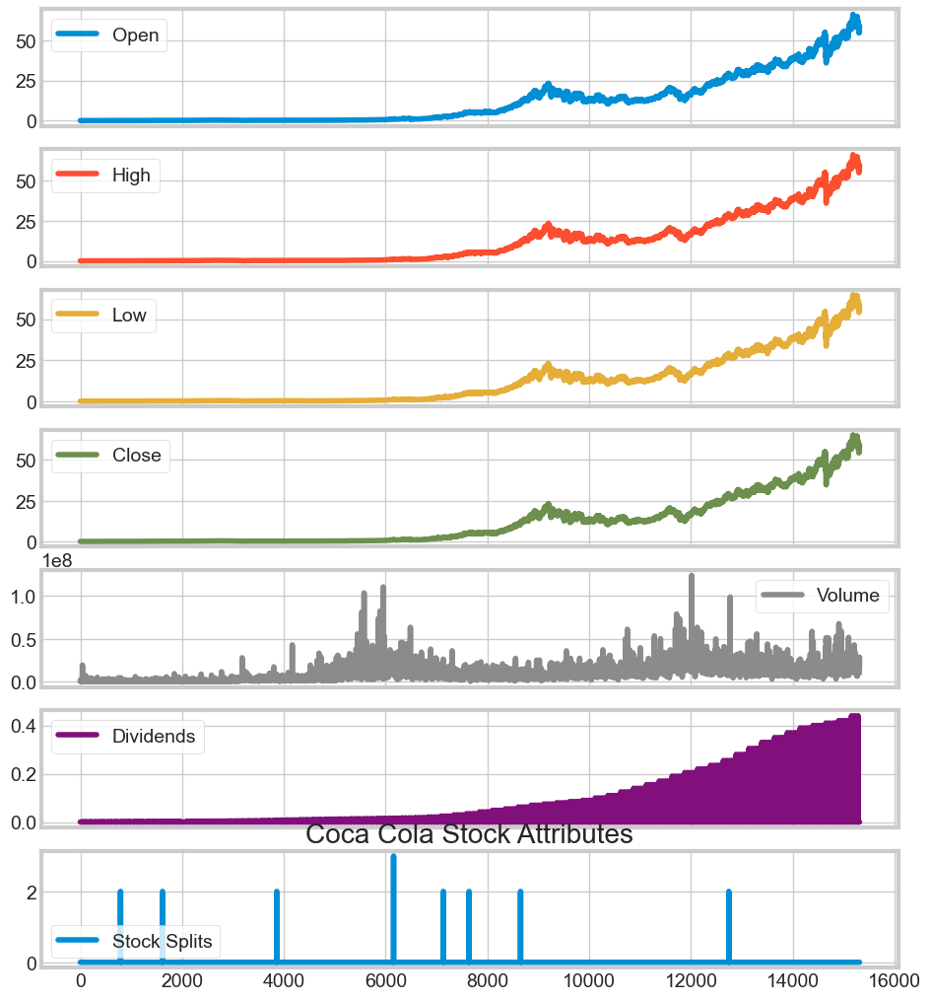

In [4]:
KO_Data.plot(subplots=True, figsize=(10,12))
plt.title('Coca Cola Stock Attributes')
plt.show()

In [5]:
def plot_close_val(data_frame, column, stock):
    plt.figure(figsize=(16,6))
    plt.title(column + ' Price History for ' + stock )
    plt.plot(data_frame[column])
    plt.xlabel('Date', fontsize=18)
    plt.ylabel(column + ' Price USD ($) for ' + stock, fontsize=18)
    plt.show()

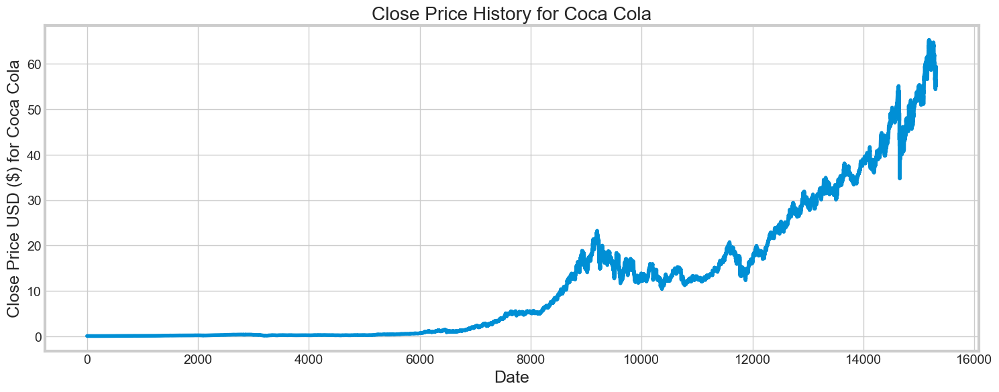

In [6]:
plot_close_val(KO_Data, 'Close', 'Coca Cola')

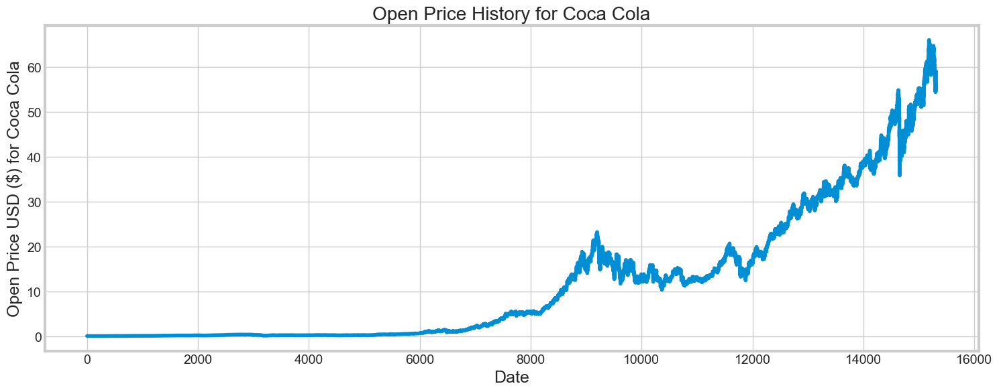

In [7]:
plot_close_val(KO_Data, 'Open', 'Coca Cola')

<Axes: >

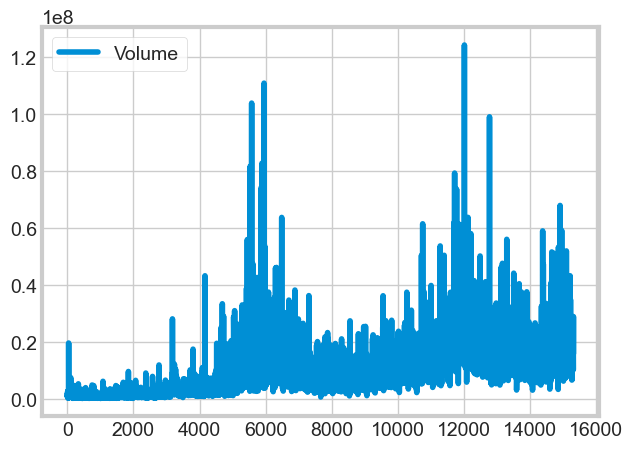

In [8]:
KO_Data[["Volume"]].plot()

## Basic Company Info

In [9]:
ko_info = pd.read_csv('Coca-Cola_stock_info.csv', header=None, names=(['Description','Information']))
ko_info.shape

(154, 2)

In [10]:
ko_info.head()

,Description,Information
0,Key,Value
1,zip,30313
2,sector,Consumer Defensive
3,fullTimeEmployees,80300
4,longBusinessSummary,"The Coca-Cola Company, a beverage company, man..."


In [11]:
ko_info.dropna()

,Description,Information
0,Key,Value
1,zip,30313
2,sector,Consumer Defensive
3,fullTimeEmployees,80300
4,longBusinessSummary,"The Coca-Cola Company, a beverage company, man..."
...,...,...
148,bidSize,800
149,dayHigh,60.345
150,regularMarketPrice,59.6
152,logo_url,https://logo.clearbit.com/coca-colacompany.com


In [12]:
ko_info.shape

(154, 2)

In [13]:
ko_info.drop(ko_info.loc[ko_info['Information']=='nan'].index, inplace=True)
ko_info.shape

(154, 2)

In [14]:
ko = ko_info.sort_values('Information').style

In [15]:
ko

,Description,Information
49,gmtOffSetMilliseconds,-18000000
145,bid,0
138,ask,0
77,heldPercentInsiders,0.00636
68,sharesPercentSharesOut,0.0074
100,shortPercentOfFloat,0.0074
108,trailingAnnualDividendYield,0.027917083
147,dividendYield,0.028099999
29,returnOnAssets,0.07831
75,SandP52WeekChange,0.15025425


## Window rolling mean (moving average) (Close)

In [16]:
adj_close_px = KO_Data['Close']

In [17]:
# Calculate the moving average

moving_avg = adj_close_px.rolling(window=40).mean()

In [18]:
moving_avg[-10:]

15301    59.573229
15302    59.329031
15303    59.103823
15304    58.921440
15305    58.725320
15306    58.504966
15307    58.298918
15308    58.171838
15309    58.088689
15310    58.030935
Name: Close, dtype: float64

In [19]:
# Short moving window rolling mean

KO_Data['42'] = adj_close_px.rolling(window=40).mean()
KO_Data['42'][-10:]

15301    59.573229
15302    59.329031
15303    59.103823
15304    58.921440
15305    58.725320
15306    58.504966
15307    58.298918
15308    58.171838
15309    58.088689
15310    58.030935
Name: 42, dtype: float64

In [20]:
# Long moving window rolling mean

KO_Data['252'] = adj_close_px.rolling(window=252).mean()
KO_Data['252'][-10:]

15301    59.627281
15302    59.635115
15303    59.646267
15304    59.662475
15305    59.675969
15306    59.684123
15307    59.696847
15308    59.715574
15309    59.740626
15310    59.766499
Name: 252, dtype: float64

In [21]:
KO_Data.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,42,252
0,1962-01-02,0.050016,0.051378,0.050016,0.050016,806400,0.0,0,NaN,NaN
1,1962-01-03,0.049273,0.049273,0.048159,0.048902,1574400,0.0,0,NaN,NaN
2,1962-01-04,0.049026,0.049645,0.049026,0.049273,844800,0.0,0,NaN,NaN
3,1962-01-05,0.049273,0.049892,0.048035,0.048159,1420800,0.0,0,NaN,NaN
4,1962-01-08,0.047787,0.047787,0.046735,0.047664,2035200,0.0,0,NaN,NaN


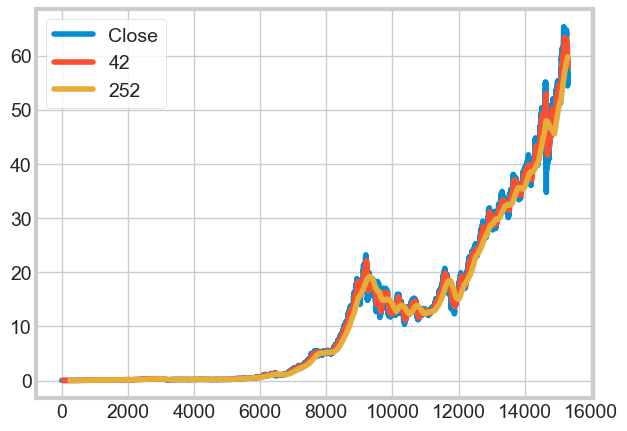

In [22]:
KO_Data[['Close', '42', '252']].plot()
plt.show()

## Percentage change (Close)

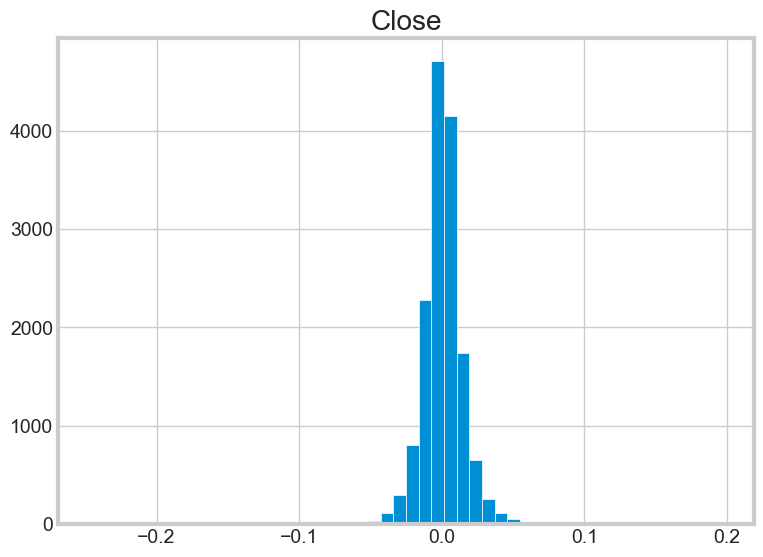

In [23]:
# Calculate the daily percentage change for `daily_close_px`

daily_close_px = KO_Data[['Close']]
daily_pct_change = daily_close_px.pct_change()

# Plot the distributions
daily_pct_change.hist(bins=50, sharex=True, figsize=(8,6))
plt.show()

In [24]:
daily_pct_change.head()

,Close
0,NaN
1,-0.022280
2,0.007598
3,-0.022616
4,-0.010282


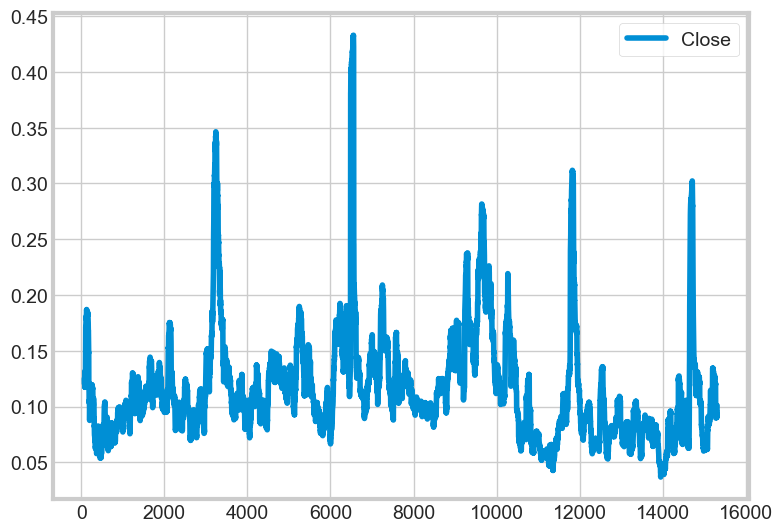

In [25]:
# Define the minumum of periods to consider
min_periods = 75

# Calculate the volatility
vol = daily_pct_change.rolling(min_periods).std() * np.sqrt(min_periods)

# Plot the volatility
vol.plot(figsize=(8, 6))
plt.show()

In [26]:
vol.tail()

,Close
15306,0.091445
15307,0.092917
15308,0.097580
15309,0.100713
15310,0.100975


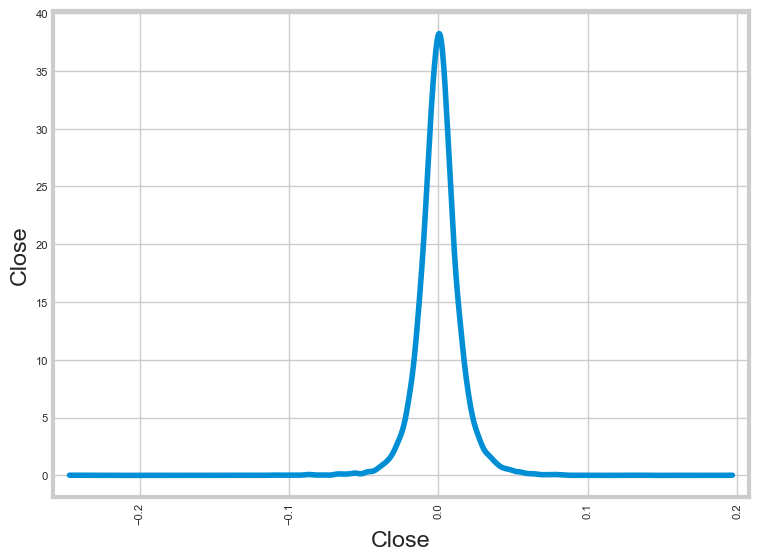

In [27]:
# Plot a scatter matrix with the `daily_pct_change` data

pd.plotting.scatter_matrix(daily_pct_change, diagonal='kde', alpha=0.1, figsize=(8,6))
plt.show()

## Basic MACD

In [28]:
KO_Data = KO_Data.reset_index()

In [29]:
KO_Data.head()

,index,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,42,252
0,0,1962-01-02,0.050016,0.051378,0.050016,0.050016,806400,0.0,0,NaN,NaN
1,1,1962-01-03,0.049273,0.049273,0.048159,0.048902,1574400,0.0,0,NaN,NaN
2,2,1962-01-04,0.049026,0.049645,0.049026,0.049273,844800,0.0,0,NaN,NaN
3,3,1962-01-05,0.049273,0.049892,0.048035,0.048159,1420800,0.0,0,NaN,NaN
4,4,1962-01-08,0.047787,0.047787,0.046735,0.047664,2035200,0.0,0,NaN,NaN


In [30]:
fig = go.Figure(data = go.Ohlc(x=KO_Data['Date'],
                               open=KO_Data['Open'],
                               high=KO_Data['High'],
                               low=KO_Data['Low'],
                               close=KO_Data['Close']
                              )
               )
fig.show()

## Basic SMA

In [31]:
KO_Data = KO_Data.reset_index()

In [32]:
KO_Data['SMA5'] = KO_Data.Close.rolling(5).mean()
KO_Data['SMA20'] = KO_Data.Close.rolling(20).mean()
KO_Data['SMA50'] = KO_Data.Close.rolling(50).mean()
KO_Data['SMA200'] = KO_Data.Close.rolling(200).mean()
KO_Data['SMA500'] = KO_Data.Close.rolling(500).mean()

In [33]:
KO_Data.head()

,level_0,index,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,42,252,SMA5,SMA20,SMA50,SMA200,SMA500
0,0,0,1962-01-02,0.050016,0.051378,0.050016,0.050016,806400,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1,1962-01-03,0.049273,0.049273,0.048159,0.048902,1574400,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2,1962-01-04,0.049026,0.049645,0.049026,0.049273,844800,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,3,1962-01-05,0.049273,0.049892,0.048035,0.048159,1420800,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,4,1962-01-08,0.047787,0.047787,0.046735,0.047664,2035200,0.0,0,NaN,NaN,0.048803,NaN,NaN,NaN,NaN


In [34]:
fig = go.Figure(data = 
      [
          go.Ohlc(
              x=KO_Data['Date'],
              open=KO_Data['Open'],
              high=KO_Data['High'],
              low=KO_Data['Low'],
              close=KO_Data['Close'],
              name = "OHLC"),
          
          go.Scatter(
              x=KO_Data.Date,
              y=KO_Data.SMA5,
              line=dict(color='orange', width=1),
              name="SMA5"),
          
          go.Scatter(
              x=KO_Data.Date,
              y=KO_Data.SMA20,
              line=dict(color='green', width=1),
              name="SMA20"),
          
          go.Scatter(
              x=KO_Data.Date,
              y=KO_Data.SMA50,
              line=dict(color='blue', width=1),
              name="SMA50"),
          
          go.Scatter(
              x=KO_Data.Date,
              y=KO_Data.SMA200,
              line=dict(color='violet', width=1),
              name="SMA200"),
          
          go.Scatter(
              x=KO_Data.Date,
              y=KO_Data.SMA500,
              line=dict(color='purple', width=1),
              name="SMA500")
      ]
     )

fig.show()